## About

This starter code shows how to read slides and tumor masks from the [CAMELYON16](https://camelyon17.grand-challenge.org/Data/) dataset. It will install [OpenSlide](https://openslide.org/) in Colab (the only non-Python dependency). Note that OpenSlide also includes a [DeepZoom viewer](https://github.com/openslide/openslide-python/tree/master/examples/deepzoom), shown in class. To use that, you'll need to install and run OpenSlide locally on your computer.

### Training data

The original slides and annotations are in an unusual format. I converted a bunch of them for you, so you can read them with OpenSlide as shown in this notebook. These will be uploaded for you the week of Oct 24th, at which point we'll update this notebook with a link. 

**Update:** This Google Drive [folder](https://drive.google.com/drive/folders/11GEhOPP0T4Oaw_Yhb4jD_fh79DNXq8no?usp=sharing) contains many additional slides and masks you can use. Note that while the starter code below downloads one slide from a Google Cloud URL (we have hosted this online for you for convenience), you will need to find a way to work with the other slides yourself for practice. You do not need to use them all! Just a few. You can either host the slides you'll use on Cloud storage using any provider, or you can download from Google Drive in your notebook (this may be slow).

Note that even with the starter code, it will take some effort to understand how to work with this data (the various zoom levels, and the coordinate system).

### Goals and grading

The goal for your project is to build a thoughtful, end-to-end prototype - not to match the accuracy from the [paper](https://arxiv.org/abs/1703.02442), and not necessarily to use all the available data. To receive an A on this work, your project should (for example):
- Use multiple zoom levels
- Use high-magnification images
- Include several visualizations of your results (both heatmaps showing predictions on individual slides, and other metrics/diagrams you design that are appropriate to communicate how well your model performs).

You are also welcome to propose a custom project of similar scope, on any topic of interest to you.

In [5]:
%load_ext autoreload
%autoreload 2

In [4]:
# # Install the OpenSlide C library and Python bindings
# # After installing these libraries, use `Runtime -> restart and run all` on the menu
# !apt-get install openslide-tools
# !pip install openslide-python

# !sudo apt-get install openslide-tools -yes
# !sudo apt-get install python-openslide -yes
# !pip install openslide-python -yes

E: Command line option 'e' [from -yes] is not understood in combination with the other options.
E: Command line option 'e' [from -yes] is not understood in combination with the other options.

Usage:   
  pip install [options] <requirement specifier> [package-index-options] ...
  pip install [options] -r <requirements file> [package-index-options] ...
  pip install [options] [-e] <vcs project url> ...
  pip install [options] [-e] <local project path> ...
  pip install [options] <archive url/path> ...

no such option: -y


In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from skimage.color import rgb2gray

In [7]:
# Download an example slide and tumor mask

# Note: the remainder of the training data are in the Google Drive folder linked above.
# You will need to host them on your own, either in Google Drive, or by using
# the cloud provider of your choice.

slide_path = 'tumor_091.tif' # only this file is available
tumor_mask_path = 'tumor_091_mask.tif' # only this file is available

slide_url = 'https://storage.googleapis.com/applied-dl/%s' % slide_path
mask_url = 'https://storage.googleapis.com/applied-dl/%s' % tumor_mask_path

# Download the whole slide image
if not os.path.exists(slide_path):
  !curl -O $slide_url

# Download the tumor mask
if not os.path.exists(tumor_mask_path):
  !curl -O $mask_url

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  521M  100  521M    0     0  29.7M      0  0:00:17  0:00:17 --:--:-- 31.1M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 14.6M  100 14.6M    0     0  9839k      0  0:00:01  0:00:01 --:--:-- 9839k


In [ ]:
slide = open_slide(slide_path)
print ("Read WSI from %s with width: %d, height: %d" % (slide_path, 
                                                        slide.level_dimensions[0][0], 
                                                        slide.level_dimensions[0][1]))

tumor_mask = open_slide(tumor_mask_path)
print ("Read tumor mask from %s" % (tumor_mask_path))

print("Slide includes %d levels", len(slide.level_dimensions))
for i in range(len(slide.level_dimensions)):
    print("Level %d, dimensions: %s downsample factor %d" % (i, 
                                                             slide.level_dimensions[i], 
                                                             slide.level_downsamples[i]))
    assert tumor_mask.level_dimensions[i][0] == slide.level_dimensions[i][0]
    assert tumor_mask.level_dimensions[i][1] == slide.level_dimensions[i][1]

# Verify downsampling works as expected
width, height = slide.level_dimensions[7]
assert width * slide.level_downsamples[7] == slide.level_dimensions[0][0]
assert height * slide.level_downsamples[7] == slide.level_dimensions[0][1]

Read WSI from tumor_091.tif with width: 61440, height: 53760
Read tumor mask from tumor_091_mask.tif
Slide includes %d levels 8
Level 0, dimensions: (61440, 53760) downsample factor 1
Level 1, dimensions: (30720, 26880) downsample factor 2
Level 2, dimensions: (15360, 13440) downsample factor 4
Level 3, dimensions: (7680, 6720) downsample factor 8
Level 4, dimensions: (3840, 3360) downsample factor 16
Level 5, dimensions: (1920, 1680) downsample factor 32
Level 6, dimensions: (960, 840) downsample factor 64
Level 7, dimensions: (480, 420) downsample factor 128


In [ ]:
# See https://openslide.org/api/python/#openslide.OpenSlide.read_region
# Note: x,y coords are with respect to level 0.
# There is an example below of working with coordinates
# with respect to a higher zoom level.

# Read a region from the slide
# Return a numpy RBG array
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

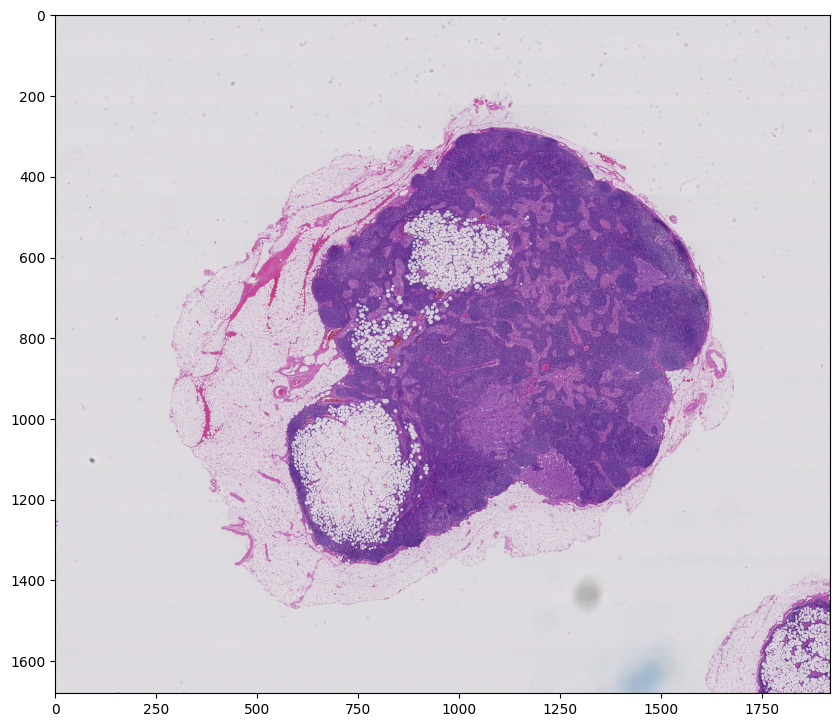

In [ ]:
# Example: read the entire slide at level 5

# Higher zoom levels may not fit into memory.
# You can use the below function to extract regions from higher zoom levels 
# without having to read the entire image into ram.

# Use the sliding window approach discussed in class to collect training
# data for your classifier. E.g., slide a window across the slide (for
# starters, use a zoomed out view, so you're not working with giant images).
# Save each window to disk as an image. To find the label for that image, 
# check to the tissue mask to see if the same region contains cancerous cells.

# Important: this is tricky to get right. Carefully debug your pipeline before
# training your model. Start with just a single image, and a relatively 
# low zoom level.

slide_image = read_slide(slide, 
                         x=0, 
                         y=0, 
                         level=5, 
                         width=slide.level_dimensions[5][0], 
                         height=slide.level_dimensions[5][1])

plt.figure(figsize=(10,10), dpi=100)
plt.imshow(slide_image)

In [ ]:
# Example: read the entire mask at the same zoom level
mask_image = read_slide(tumor_mask, 
                        x=0, 
                        y=0, 
                        level=5, 
                        width=slide.level_dimensions[5][0], 
                        height=slide.level_dimensions[5][1])

# Note: the program provided by the dataset authors generates a mask with R,G,B channels.
# The mask info we need is in the first channel only.
# If you skip this step, the mask will be displayed as all black.
mask_image = mask_image[:,:,0]

plt.figure(figsize=(10,10), dpi=100)
plt.imshow(mask_image)

In [ ]:
# Overlay them. The idea is that the mask shows the region of the slide that
# contain cancerous cells.
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(slide_image)
plt.imshow(mask_image, cmap='jet', alpha=0.5) # Red regions contains cancer.

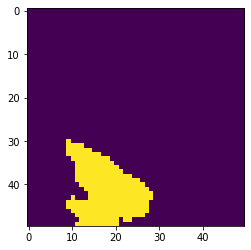

In [ ]:
# Example: extract a region from the L7 downsampled image
# Notice we're multiplying the x,y coordinates by the downsample factor.
# This math can be tricky to get right, debug carefully.
# Here, we're "aiming" for the top right blob in the image above.
region = read_slide(tumor_mask, x=350 * 128, y=120 * 128, level=7, width=50, height=50)[:,:,0]
plt.imshow(region)

905504 tissue_pixels pixels (32.1 percent of the image)


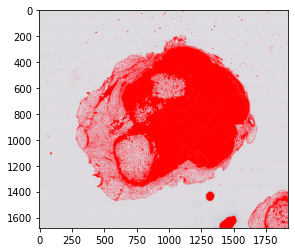

In [ ]:
# As mentioned in class, we can improve efficiency by ignoring non-tissue areas 
# of the slide. We'll find these by looking for all gray regions.
def find_tissue_pixels(image, intensity=0.8):
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    return list(zip(indices[0], indices[1]))

tissue_pixels = find_tissue_pixels(slide_image)
percent_tissue = len(tissue_pixels) / float(slide_image.shape[0] * slide_image.shape[0]) * 100
print ("%d tissue_pixels pixels (%.1f percent of the image)" % (len(tissue_pixels), percent_tissue)) 

def apply_mask(im, mask, color=(255,0,0)):
    masked = np.copy(im)
    for x,y in mask: masked[x][y] = color
    return masked

tissue_regions = apply_mask(slide_image, tissue_pixels)
plt.imshow(tissue_regions)

# Example Slide (Zoom level 2)



## Download data

In [5]:
# Install the OpenSlide C library and Python bindings
# After installing these libraries, use `Runtime -> restart and run all` on the menu
!apt-get install openslide-tools
!pip install openslide-python

E: Could not open lock file /var/lib/dpkg/lock-frontend - open (13: Permission denied)
E: Unable to acquire the dpkg frontend lock (/var/lib/dpkg/lock-frontend), are you root?


In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from skimage.color import rgb2gray

In [7]:
slide_path_91 = 'tumor_091.tif'
tumor_mask_path_91 = 'tumor_091_mask.tif'

slide_url_91 = 'https://storage.googleapis.com/applied-dl/%s' % slide_path_91
mask_url_91 = 'https://storage.googleapis.com/applied-dl/%s' % tumor_mask_path_91

# Download the whole slide image
if not os.path.exists(slide_path_91):
  !curl -O $slide_url_91

# Download the tumor mask
if not os.path.exists(tumor_mask_path_91):
  !curl -O $mask_url_91

## Get to know the slide

In [8]:
slide_91 = open_slide(slide_path_91)
print ("Read WSI from %s with width: %d, height: %d" % (slide_path_91, 
                                                        slide_91.level_dimensions[0][0], 
                                                        slide_91.level_dimensions[0][1]))

tumor_mask_91 = open_slide(tumor_mask_path_91)
print ("Read tumor mask from %s" % (tumor_mask_path_91))

print("Slide includes %d levels", len(slide_91.level_dimensions))
for i in range(len(slide_91.level_dimensions)):
    print("Level %d, dimensions: %s downsample factor %d" % (i, 
                                                             slide_91.level_dimensions[i], 
                                                             slide_91.level_downsamples[i]))
    assert tumor_mask_91.level_dimensions[i][0] == slide_91.level_dimensions[i][0]
    assert tumor_mask_91.level_dimensions[i][1] == slide_91.level_dimensions[i][1]

# Verify downsampling works as expected
width, height = slide_91.level_dimensions[7]
assert width * slide_91.level_downsamples[7] == slide_91.level_dimensions[0][0]
assert height * slide_91.level_downsamples[7] == slide_91.level_dimensions[0][1]

Read WSI from tumor_091.tif with width: 61440, height: 53760
Read tumor mask from tumor_091_mask.tif
Slide includes %d levels 8
Level 0, dimensions: (61440, 53760) downsample factor 1
Level 1, dimensions: (30720, 26880) downsample factor 2
Level 2, dimensions: (15360, 13440) downsample factor 4
Level 3, dimensions: (7680, 6720) downsample factor 8
Level 4, dimensions: (3840, 3360) downsample factor 16
Level 5, dimensions: (1920, 1680) downsample factor 32
Level 6, dimensions: (960, 840) downsample factor 64
Level 7, dimensions: (480, 420) downsample factor 128


In [9]:
slide_91

OpenSlide('tumor_091.tif')

In [10]:
# Read a region from the slide
# Return a numpy RBG array
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

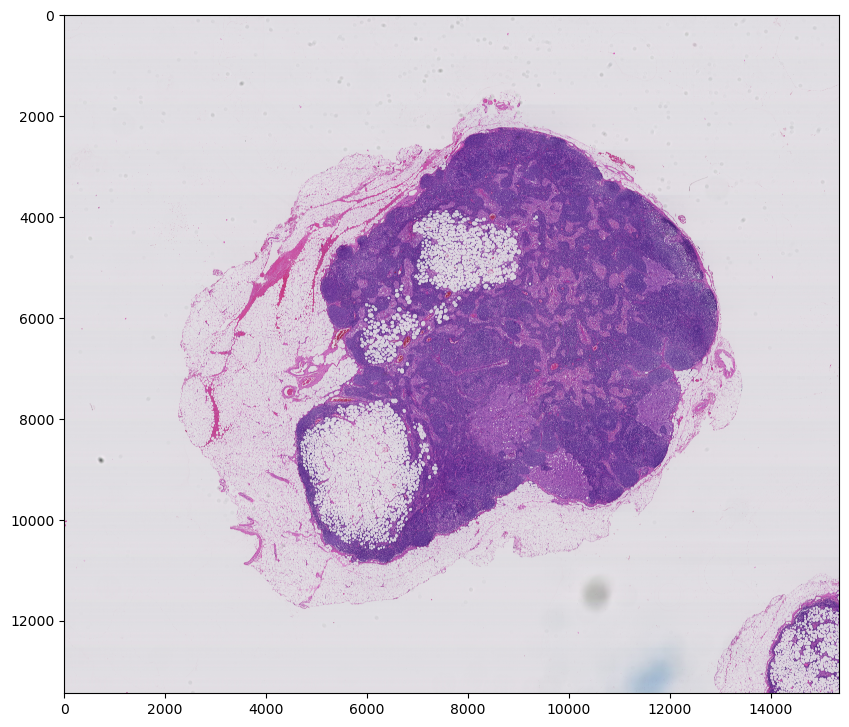

In [11]:
# read the entire slide at level 2

slide_image_91_z2 = read_slide(slide_91, 
                         x=0, 
                         y=0, 
                         level=2, 
                         width=slide_91.level_dimensions[2][0], 
                         height=slide_91.level_dimensions[2][1])

plt.figure(figsize=(10,10), dpi=100)
plt.imshow(slide_image_91_z2)

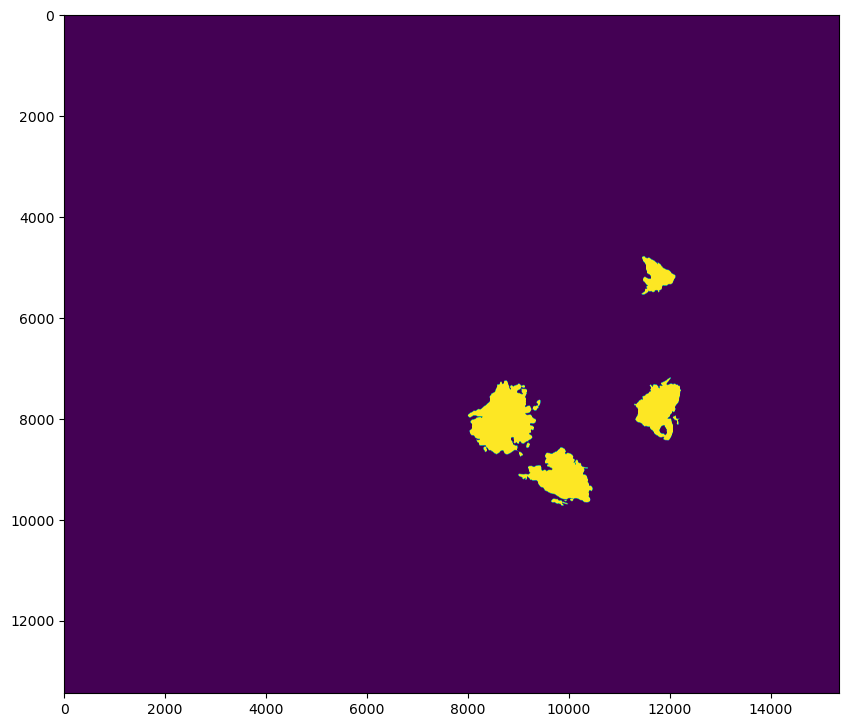

In [12]:
# Example: read the entire mask at level 2
mask_image_91_z2 = read_slide(tumor_mask_91, 
                        x=0, 
                        y=0, 
                        level=2, 
                        width=slide_91.level_dimensions[2][0], 
                        height=slide_91.level_dimensions[2][1])

mask_image_91_z2 = mask_image_91_z2[:,:,0]

plt.figure(figsize=(10,10), dpi=100)
plt.imshow(mask_image_91_z2)

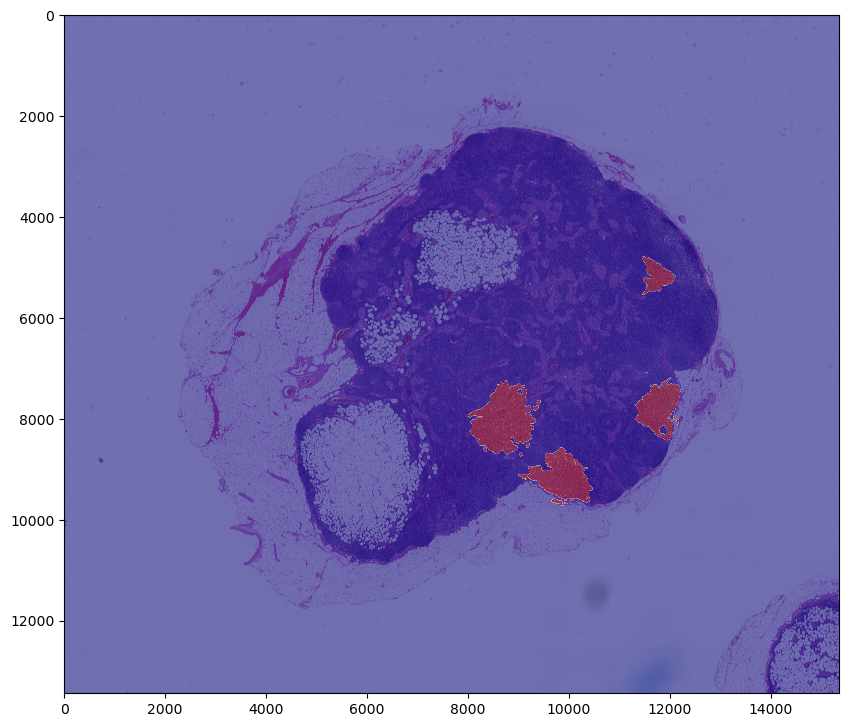

In [13]:
# Overlay them
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(slide_image_91_z2)
plt.imshow(mask_image_91_z2, cmap='jet', alpha=0.5) # Red regions contains cancer.

In [14]:
# Find non-tissue areas by looking for all gray regions.
def find_tissue_pixels(image, intensity=0.8):
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    return list(zip(indices[0], indices[1]))

52480540 tissue_pixels pixels (29.1 percent of the image)


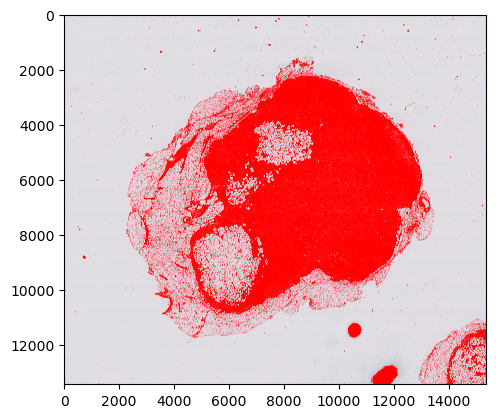

In [15]:
tissue_pixels_91_z2 = find_tissue_pixels(slide_image_91_z2)
percent_tissue_91_z2 = len(tissue_pixels_91_z2) / float(slide_image_91_z2.shape[0] * slide_image_91_z2.shape[0]) * 100
print ("%d tissue_pixels pixels (%.1f percent of the image)" % (len(tissue_pixels_91_z2), percent_tissue_91_z2)) 

def apply_mask(im, mask, color=(255,0,0)):
    masked = np.copy(im)
    for x,y in mask: masked[x][y] = color
    return masked

tissue_regions_91_z2 = apply_mask(slide_image_91_z2, tissue_pixels_91_z2)
plt.imshow(tissue_regions_91_z2)

## Preprocess data

### Get windows

In [16]:
# get all non-tissue windows test version 
def get_windows(slide_paths, tumor_mask_paths, level, stride = 150, window_len=299, threshold = 0.5):
  slide_windows = []
  contains_cancer = []

  for slide_path, tumor_mask_path in zip(slide_paths, tumor_mask_paths):
    slide = open_slide(slide_path)
    tumor_mask = open_slide(tumor_mask_path)

    window_width = slide.level_dimensions[level][0] - window_len + 1 
    window_height = slide.level_dimensions[level][1] - window_len + 1
    downsample_factor = slide.level_downsamples[level]
    
    # sliding window
    for w in range(0, window_width, stride):
      for h in range(0, window_height, stride):
        curr_coord = (int(w*downsample_factor), int(h*downsample_factor))

        curr_slide = read_slide(slide,
                                 x=curr_coord[0],
                                 y=curr_coord[1],
                                 level=level,
                                 width=window_len,
                                 height=window_len)
        
        curr_tumor_mask = read_slide(tumor_mask,
                                      x=curr_coord[0],
                                      y=curr_coord[1],
                                      level=level,
                                      width=window_len,
                                      height=window_len)
        
        # calculate the percentage of tissue
        tissue_pixels = find_tissue_pixels(curr_slide)
        #print(tissue_pixels)
        percent_tissue = len(tissue_pixels) / float(curr_slide.shape[0] * curr_slide.shape[0] ) 
        #print("curr_slide shape", curr_slide.shape[0])) 
        #print("curr_slide shape", curr_slide.shape[0])

        if percent_tissue >= 0.2 and np.mean(curr_slide) > 0.2:
          slide_windows.append(curr_slide)
          if np.sum(curr_tumor_mask[:,:,0]) / (window_len * window_len)  >= threshold:
            contains_cancer.append(1)
          else:
            contains_cancer.append(0)

  return slide_windows, contains_cancer

In [4]:
slide_windows_91, contains_cancer_91 = get_windows([slide_path_91], [tumor_mask_path_91], 2)

# Percentage of windows with tumor
print("{:.1f}% windows with cancer ({:d}/{:d}) ".format(sum(contains_cancer_91)/len(contains_cancer_91)*100, sum(contains_cancer_91), len(contains_cancer_91)))

NameError: name 'slide_path_91' is not defined

In [27]:
def display_windows(images, row, col, x, y):
  fig = plt.figure(figsize=(x,y))
  shuffle = np.arange(len(images))
  np.random.shuffle(shuffle)
  for i in range(row):
    for j in range(col):
      idx = i*row+j
      ax = fig.add_subplot(col, row, idx+1)
      plt.imshow(images[shuffle[idx]])
      ax.axes.get_xaxis().set_visible(False)
      ax.axes.get_yaxis().set_visible(False)

In [28]:
windows_w_tumor_91 = [slide_windows_91[i] for i in range(len(contains_cancer_91)) if contains_cancer_91[i]==1]
windows_wo_tumor_91 = [slide_windows_91[i] for i in range(len(contains_cancer_91)) if contains_cancer_91[i]==0]

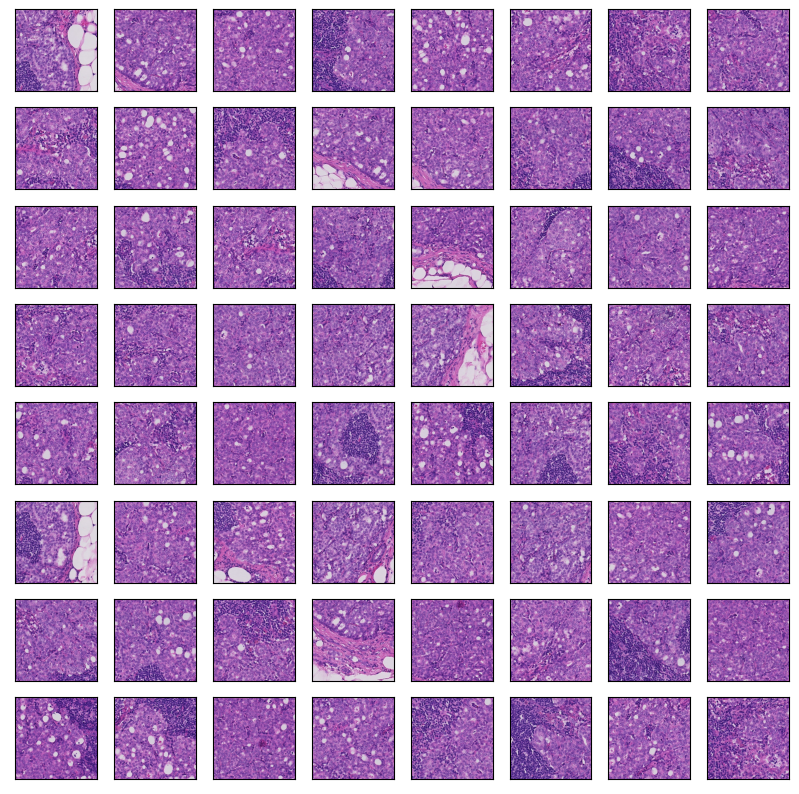

In [29]:
display_windows(windows_w_tumor_91, 8, 8, 10, 10)

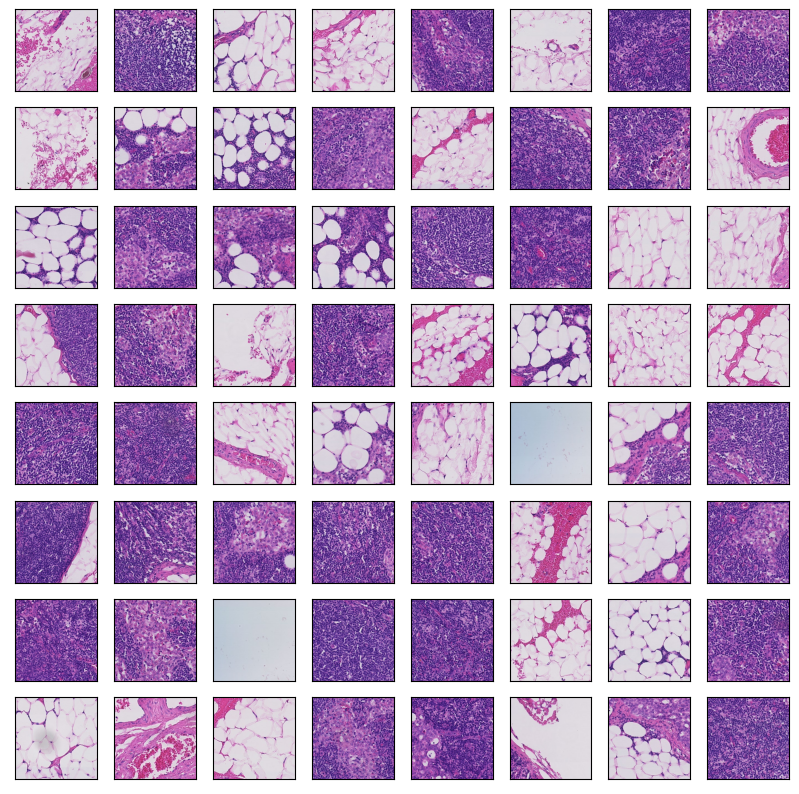

In [30]:
display_windows(windows_wo_tumor_91, 8, 8, 10, 10)

### Shuffle and balance data

In [31]:
# shuffle and balance dataset
shuffle_wo_tumor_91 = np.arange(len(windows_wo_tumor_91))
np.random.shuffle(shuffle_wo_tumor_91)

ds_windows_91 = windows_w_tumor_91 + [windows_wo_tumor_91[shuffle_wo_tumor_91[i]] for i in shuffle_wo_tumor_91[:len(windows_w_tumor_91)]]
ds_labels_91 = np.array([1]*len(windows_w_tumor_91) + [0]*len(windows_w_tumor_91))

shuffle_all_91 = np.arange(len(ds_windows_91))
np.random.shuffle(shuffle_all_91)

ds_windows_91 = np.array([ds_windows_91[i] for i in shuffle_all_91 ])
ds_labels_91 = np.array([ds_labels_91[i] for i in shuffle_all_91 ])

In [32]:
ds_windows_w_tumor_91 = [ds_windows_91[i] for i in range(len(ds_labels_91)) if ds_labels_91[i]==1]
ds_windows_wo_tumor_91 = [ds_windows_91[i] for i in range(len(ds_labels_91)) if ds_labels_91[i]==0]

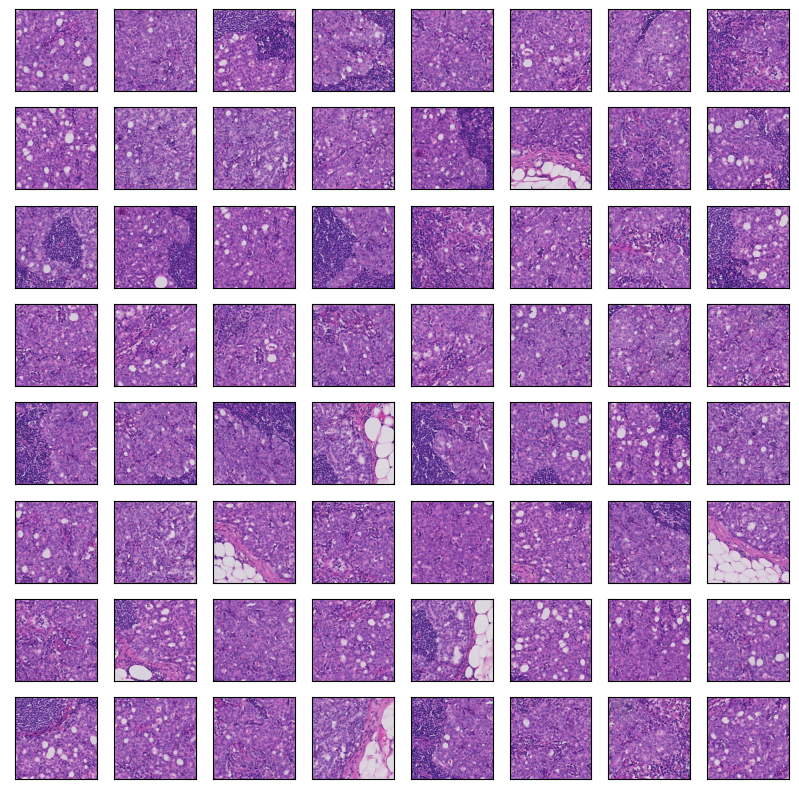

In [33]:
display_windows(ds_windows_w_tumor_91, 8, 8, 10, 10)

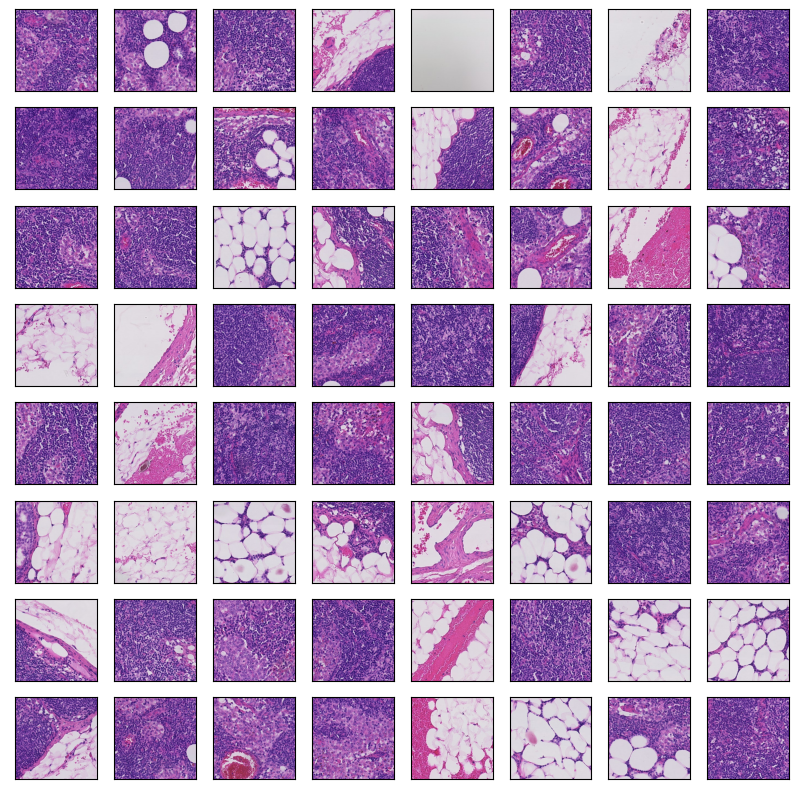

In [34]:
display_windows(ds_windows_wo_tumor_91, 8, 8, 10, 10)

### Save windows to disk as images


In [35]:
# create directory to store windows
slide_num = slide_path_91.split('.')[0].split('_')[1]
level = '2'
colab_root = "./content" 
if not os.path.exists(colab_root):
    os.mkdir(colab_root)
slide_91_level2_dir = os.path.join(colab_root, "slide_" + slide_num + '_level_' + level)

if not os.path.exists(slide_91_level2_dir):
    os.mkdir(slide_91_level2_dir)

In [36]:
# save images to disk
for i, window in enumerate(ds_windows_91):
  img = Image.fromarray(window, 'RGB')
  img_name = 'window_' + str(i) + '.jpg'
  file_path = os.path.join(slide_91_level2_dir, img_name)
  img.save(img_name)
  np.save(open(file_path, 'wb'), img)

### Load image from disk

In [2]:
images = []
for i, window in enumerate(ds_windows_91):
  img_name = 'window_' + str(i) + '.jpg'
  file_path = os.path.join(slide_91_level2_dir, img_name)
  image = np.load(file_path)
  images.append(image)

NameError: name 'ds_windows_91' is not defined

In [38]:
images_w_tumor_91 = [images[i] for i in range(len(ds_labels_91)) if ds_labels_91[i]==1]
images_wo_tumor_91 = [images[i] for i in range(len(ds_labels_91)) if ds_labels_91[i]==0]

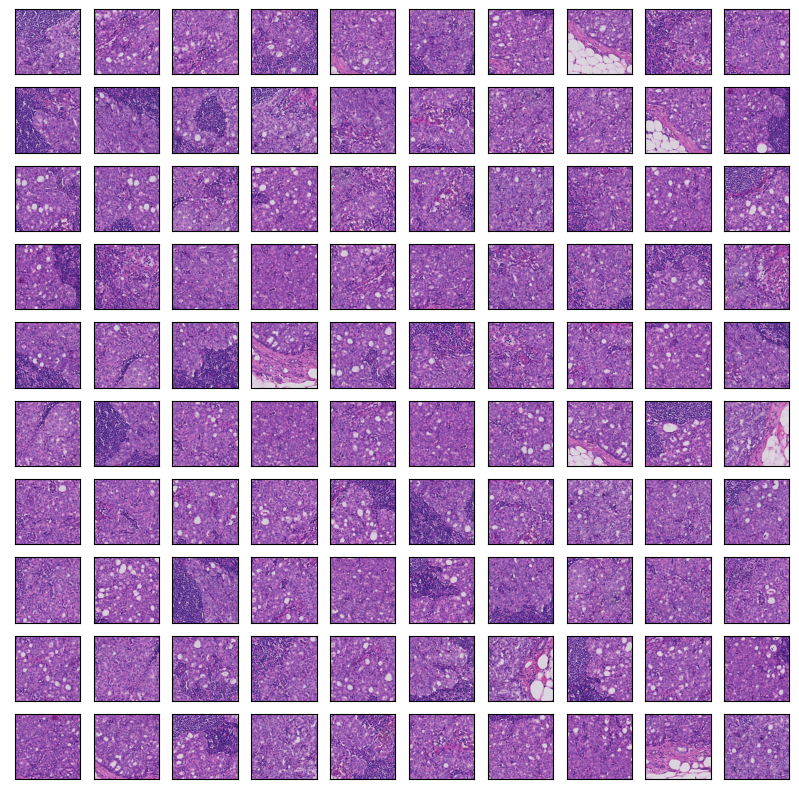

In [39]:
display_windows(images_w_tumor_91, 10, 10, 10, 10)

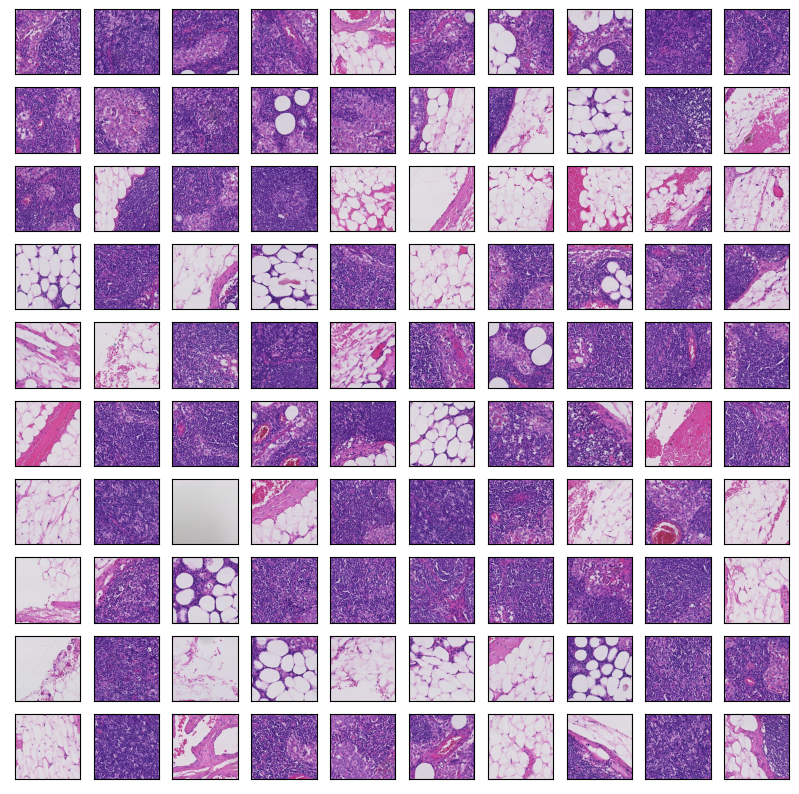

In [40]:
display_windows(images_wo_tumor_91, 10, 10, 10, 10)

## Create dataset for traininig, validation and testing

In [62]:
# train test split 80:20
train_window_91 = np.array(images[:len(images)//10*8])
train_label_91 = np.array(ds_labels_91[:len(images)//10*8])

test_window_91 = np.array(images[len(images)//10*8:])
test_label_91 = np.array(ds_labels_91[len(images)//10*8:])

In [63]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(train_window_91, train_label_91, test_size=0.2)

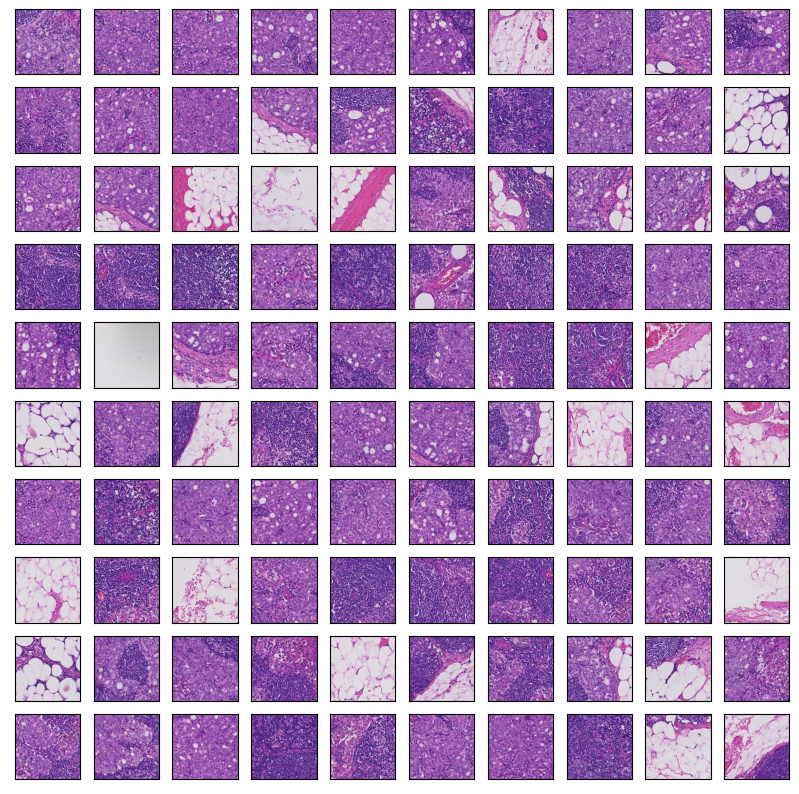

In [64]:
display_windows(X_train, 10, 10, 10, 10)

In [65]:
len(X_train)

160

In [50]:
len(X_test)

40

In [ ]:
display_windows(X_train, 8, 8, 10, 10)

## Customer CNN Model

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
num_classes = 2
img_height, img_width = 299, 299
model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

2022-12-16 04:57:40.573451: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-16 04:57:40.774655: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-12-16 04:57:41.769409: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/nccl2/lib:/usr/local/cuda/extras/CUPTI/lib64
2022-12-16 04:57:41.769535: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer

In [67]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [68]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 299, 299, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 299, 299, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 149, 149, 16)     0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 149, 149, 32)      4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 74, 74, 64)       

In [69]:
epochs=50
history = model.fit(x = X_train, y = y_train,
  validation_data=(X_test, y_test),
  epochs=epochs
)

Epoch 1/50


2022-12-16 01:31:46.264775: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8200


5/5 [==============================] - 14s 128ms/step - loss: 5.9130 - accuracy: 0.5000 - val_loss: 0.9195 - val_accuracy: 0.4250
Epoch 2/50
5/5 [==============================] - 0s 51ms/step - loss: 0.7578 - accuracy: 0.4375 - val_loss: 0.7062 - val_accuracy: 0.4250
Epoch 3/50
5/5 [==============================] - 0s 51ms/step - loss: 0.6916 - accuracy: 0.5125 - val_loss: 0.6587 - val_accuracy: 0.5750
Epoch 4/50
5/5 [==============================] - 0s 51ms/step - loss: 0.6661 - accuracy: 0.6000 - val_loss: 0.6564 - val_accuracy: 0.6500
Epoch 5/50
5/5 [==============================] - 0s 52ms/step - loss: 0.6470 - accuracy: 0.6313 - val_loss: 0.6299 - val_accuracy: 0.7000
Epoch 6/50
5/5 [==============================] - 0s 50ms/step - loss: 0.6081 - accuracy: 0.6812 - val_loss: 0.5213 - val_accuracy: 0.5750
Epoch 7/50
5/5 [==============================] - 0s 51ms/step - loss: 0.5575 - accuracy: 0.6375 - val_loss: 0.4797 - val_accuracy: 0.6250
Epoch 8/50
5/5 [====================

In [71]:
X_train.shape

(160, 299, 299, 3)

## Generate Heatmap

In [98]:
# def get_windows(slide_paths, tumor_mask_paths, level, stride = 150, window_len=299, threshold = 0.5):
def generate_raw_patch(slide_paths, level, stride = 150, window_len=299):
    slide_windows = []
    slide_coord = []
#   contains_cancer = []

#   for slide_path, tumor_mask_path in zip(slide_paths, tumor_mask_paths):
    for slide_path in slide_paths:
        slide = open_slide(slide_path)
#         tumor_mask = open_slide(tumor_mask_path)

        window_width = slide.level_dimensions[level][0] - window_len + 1 
        window_height = slide.level_dimensions[level][1] - window_len + 1
        downsample_factor = slide.level_downsamples[level]

        # sliding window
        for w in range(0, window_width, stride):
          for h in range(0, window_height, stride):
            curr_coord = (int(w*downsample_factor), int(h*downsample_factor))

            curr_slide = read_slide(slide,
                                     x=curr_coord[0],
                                     y=curr_coord[1],
                                     level=level,
                                     width=window_len,
                                     height=window_len)
            slide_windows.append(curr_slide)
            slide_coord.append(curr_coord)
        
    #       if np.sum(curr_tumor_mask[:,:,0]) / (window_len * window_len)  >= threshold:
    #         contains_cancer.append(1)
    #       else:
    #         contains_cancer.append(0)

#   return slide_windows, contains_cancer
    return slide_windows, slide_coord

In [99]:
slide_windows_generated, slide_windows_coord  = generate_raw_patch([slide_path_91], 2, stride = 150, window_len=299)

In [100]:
slide_windows_generated = np.array(slide_windows_generated)

In [101]:
slide_windows_generated.shape

(8888, 299, 299, 3)

In [107]:
fill_0 = np.zeros([10,10])

In [109]:
fill_0.shape

(10, 10)

In [112]:
fill_0 [0:9, 5:7] = np.ones([9, 1])

In [113]:
fill_0

array([[0., 0., 0., 0., 0., 1., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [114]:
 slide_windows_coord

[(0, 0),
 (0, 600),
 (0, 1200),
 (0, 1800),
 (0, 2400),
 (0, 3000),
 (0, 3600),
 (0, 4200),
 (0, 4800),
 (0, 5400),
 (0, 6000),
 (0, 6600),
 (0, 7200),
 (0, 7800),
 (0, 8400),
 (0, 9000),
 (0, 9600),
 (0, 10200),
 (0, 10800),
 (0, 11400),
 (0, 12000),
 (0, 12600),
 (0, 13200),
 (0, 13800),
 (0, 14400),
 (0, 15000),
 (0, 15600),
 (0, 16200),
 (0, 16800),
 (0, 17400),
 (0, 18000),
 (0, 18600),
 (0, 19200),
 (0, 19800),
 (0, 20400),
 (0, 21000),
 (0, 21600),
 (0, 22200),
 (0, 22800),
 (0, 23400),
 (0, 24000),
 (0, 24600),
 (0, 25200),
 (0, 25800),
 (0, 26400),
 (0, 27000),
 (0, 27600),
 (0, 28200),
 (0, 28800),
 (0, 29400),
 (0, 30000),
 (0, 30600),
 (0, 31200),
 (0, 31800),
 (0, 32400),
 (0, 33000),
 (0, 33600),
 (0, 34200),
 (0, 34800),
 (0, 35400),
 (0, 36000),
 (0, 36600),
 (0, 37200),
 (0, 37800),
 (0, 38400),
 (0, 39000),
 (0, 39600),
 (0, 40200),
 (0, 40800),
 (0, 41400),
 (0, 42000),
 (0, 42600),
 (0, 43200),
 (0, 43800),
 (0, 44400),
 (0, 45000),
 (0, 45600),
 (0, 46200),
 (0, 46

### todo: check the start and end coord of level x 

In [143]:
def make_prediction(model, slide_windows, slide_coord, window_len = 299,
                    stride = 150, level_0_wid = 61440, level_0_height =  53760):
    #maybe stride not needed?
    
    final_output = np.zeros([level_0_wid,level_0_height])#todo: which dimension? 
    
    pred = model.predict(slide_windows)
    pred = np.argmax(pred, axis=1) 
    
    fill_1 = np.ones([window_len, window_len])
    fill_0 = np.zeros([window_len, window_len])
    
    for i in range(len(slide_coord)):
        x_left = slide_coord[i][0] #to do :check is it correct or need to swap? 
        y_left = slide_coord[i][1]
        if pred[i] == 1:
            final_output[x_left: x_left + window_len, y_left : y_left + window_len] = fill_1

            print("current coord is ",slide_coord[i] )
#         else:
#              final_output[x_left: x_left + window_len, y_left : y_left + window_len] = fill_0
    return final_output
    
#     for window, coor in slide_windows:
        
#         pred = model.predict()
    
    
    

In [144]:
final_image= make_prediction(model,slide_windows_generated, slide_windows_coord)

MemoryError: Unable to allocate 24.6 GiB for an array with shape (61440, 53760) and data type float64

In [127]:
final_image.shape

(61440, 53760)

In [129]:
final_image

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [131]:
 temp = np.where(final_image == 1)

In [138]:
print(len(temp[0]))

22439651


In [128]:
np.sum(final_image)

22439651.0

In [119]:
from PIL import Image

In [121]:
img = final_image.resize((460, 420))

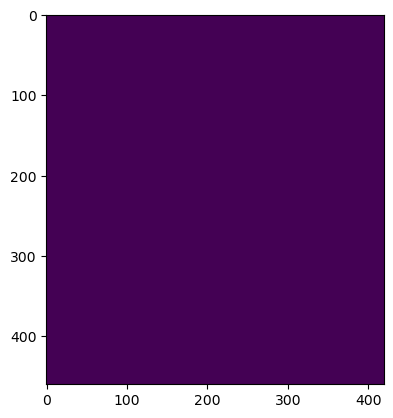

In [124]:
plt.imshow(final_image)

In [125]:
plt.show()